In [1]:
import pandas as pd
import geopandas as gpd
import osmnx as ox
import folium
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Workaround to fix chrome issue where folium won't plot maps with a large number of layers
# See comment by dstein64 at: https://github.com/python-visualization/folium/issues/812

import base64
def _repr_html_(self, **kwargs):
    html = base64.b64encode(self.render(**kwargs).encode('utf8')).decode('utf8')
    onload = (
        'this.contentDocument.open();'
        'this.contentDocument.write(atob(this.getAttribute(\'data-html\')));'
        'this.contentDocument.close();'
    )
    if self.height is None:
        iframe = (
            '<div style="width:{width};">'
            '<div style="position:relative;width:100%;height:0;padding-bottom:{ratio};">'
            '<iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;'
            'border:none !important;" '
            'data-html={html} onload="{onload}" '
            'allowfullscreen webkitallowfullscreen mozallowfullscreen>'
            '</iframe>'
            '</div></div>').format
        iframe = iframe(html=html, onload=onload, width=self.width, ratio=self.ratio)
    else:
        iframe = ('<iframe src="about:blank" width="{width}" height="{height}"'
                  'style="border:none !important;" '
                  'data-html={html} onload="{onload}" '
                  '"allowfullscreen" "webkitallowfullscreen" "mozallowfullscreen">'
                  '</iframe>').format
        iframe = iframe(html=html, onload=onload, width=self.width, height=self.height)
    return iframe

folium.branca.element.Figure._repr_html_ = _repr_html_


In [3]:
# define area of interest
# Glasgow: [55.8642,-4.2518]
latlon = [55.8642,-4.2518]
dist = 1000
graph = ox.graph_from_point(latlon,distance=dist)

In [4]:
nodes, streets = ox.graph_to_gdfs(graph)
nodes.head()

,y,x,osmid,highway,ref,geometry
1172238357,55.861840,-4.244511,1172238357,NaN,NaN,POINT (-4.24451 55.86184)
913641498,55.863833,-4.245371,913641498,NaN,NaN,POINT (-4.24537 55.86383)
4356767776,55.861552,-4.238203,4356767776,NaN,NaN,POINT (-4.23820 55.86155)
913641506,55.862675,-4.240864,913641506,NaN,NaN,POINT (-4.24086 55.86267)
913641509,55.862147,-4.240754,913641509,NaN,NaN,POINT (-4.24075 55.86215)


In [5]:
streets.head()

,u,v,key,osmid,highway,oneway,length,geometry,name,maxspeed,lanes,ref,bridge,access,service,tunnel,width,est_width
0,1172238357,1172237810,0,101519078,path,False,8.502,"LINESTRING (-4.24451 55.86184, -4.24464 55.86186)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1172238357,1172238191,0,"[101519057, 101519084]","[steps, path]",False,30.789,"LINESTRING (-4.24451 55.86184, -4.24452 55.861...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1172238357,1172237591,0,101519078,path,False,14.163,"LINESTRING (-4.24451 55.86184, -4.24443 55.861...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,913641498,6970176558,0,77663265,pedestrian,False,8.290,"LINESTRING (-4.24537 55.86383, -4.24533 55.86376)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,913641498,6970176545,0,"[77663265, 744750267]",pedestrian,False,17.817,"LINESTRING (-4.24537 55.86383, -4.24541 55.863...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


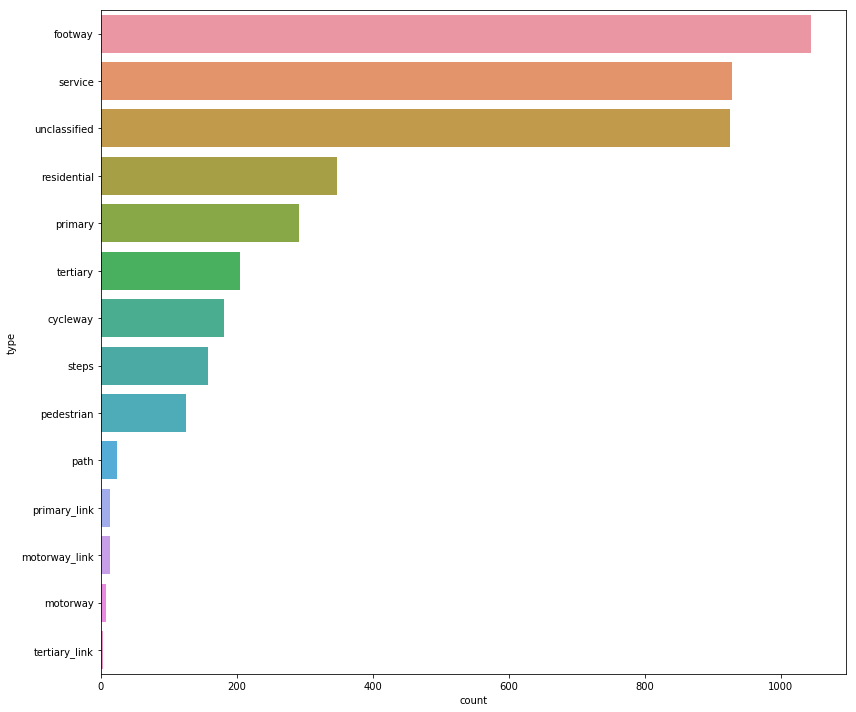

In [46]:
street_types = pd.DataFrame(streets["highway"].apply(pd.Series)[0].value_counts().reset_index())
street_types.columns = ["type", "count"]
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(y="type", x="count", data=street_types, ax=ax)
plt.tight_layout()
plt.savefig("barchart.png")

In [8]:
style = {'color': '#F7DC6F', 'weight':'1'}
m = folium.Map(latlon,
               zoom_start=15,
               tiles="CartoDb dark_matter")
folium.GeoJson(streets, style_function=lambda x: style).add_to(m)
m.save("streets.html")
m

In [9]:
buildings = ox.footprints_from_point(latlon,distance=dist)

In [30]:
# buildings.head()
# buildings[buildings.food.notnull()]
buildings.columns

Index(['nodes', 'building', 'name', 'shop', 'wikidata', 'wikipedia',
       'geometry', 'addr:city', 'addr:housenumber', 'addr:postcode',
       ...
       'network', 'building:architecture', 'elevation', 'delivery',
       'fee:amount', 'ele', 'food', 'members', 'name:gd', 'type'],
      dtype='object', length=109)

In [11]:
style_buildings = {'color':'#6C3483 ', 'fillColor': '#6C3483 ', 'weight':'1', 'fillOpacity' : 1}

m = folium.Map(latlon,
               zoom_start=15,

               tiles="Stamen Toner")

folium.GeoJson(buildings, style_function=lambda x: style_buildings).add_to(m)
m.save("buildings.html")
m

In [12]:
cafe = ox.pois_from_point(latlon,distance=dist, amenities=["cafe"])

In [13]:
cafe.head()

,osmid,geometry,amenity,name,element_type,brand,brand:wikidata,brand:wikipedia,cuisine,official_name,...,drive_through,email,landuse,payment:cash,payment:credit_cards,payment:debit_cards,payment:mastercard,payment:visa,start_date,tourism
611389580,611389580,POINT (-4.24616 55.85967),cafe,Tinderbox,node,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
727456011,727456011,POINT (-4.25633 55.86658),cafe,Cafe Royal,node,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1163254712,1163254712,POINT (-4.25472 55.86191),cafe,Starbucks,node,Starbucks,Q37158,en:Starbucks,coffee_shop,Starbucks Coffee,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1311975904,1311975904,POINT (-4.25474 55.85768),cafe,Costa,node,Costa,Q608845,en:Costa Coffee,coffee_shop,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1311976193,1311976193,POINT (-4.25353 55.86006),cafe,Starbucks,node,Starbucks,Q37158,en:Starbucks,coffee_shop,Starbucks Coffee,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
cafe_points = cafe[cafe.geom_type == "Point"]

In [24]:
m = folium.Map(latlon, zoom_start=15, tiles="CartoDb dark_matter")
locs = zip(cafe_points.geometry.y, cafe_points.geometry.x)
#folium.GeoJson(buildings, style_function=lambda x: style_buildings).add_to(m)
for location in locs:
    folium.CircleMarker(location=location, 
        color = "#F4F6F7",   radius=1).add_to(m)
    
# add streets
style = {'color': '#F7DC6F', 'weight':'1'}
# m = folium.Map(latlon,
#                zoom_start=15,
#                tiles="CartoDb dark_matter")
folium.GeoJson(streets, style_function=lambda x: style).add_to(m)
    
    
tooltip = 'Click me!'

folium.Marker([55.8641, -4.2519], popup='<i>Potential bike share location</i>', tooltip=tooltip).add_to(m)

m.save("cafes.html")
m

In [38]:
bike_rentals = ox.pois_from_point(latlon,distance=dist*10, amenities=["bicycle_rental"])
bike_rentals

,osmid,geometry,amenity,name,operator,element_type,bicycle_parking,capacity,covered,network,...,website,source,fixme,description,brand,brand:wikidata,brand:wikipedia,lit,opening_hours,supervised
2465743006,2465743006,POINT (-4.30117 55.82391),bicycle_rental,South West Community Cycles,South West Community Cycles,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2609550746,2609550746,POINT (-4.26542 55.83446),bicycle_rental,NaN,nextbike,node,stands,10,no,nextbike,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889605124,2889605124,POINT (-4.23743 55.86290),bicycle_rental,Glasgow Cathedral,nextbike,node,NaN,NaN,NaN,NaN,...,http://www.glasgowcathedral.org/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889615098,2889615098,POINT (-4.24102 55.86300),bicycle_rental,University of Strathclyde (North),nextbike,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889619927,2889619927,POINT (-4.24191 55.86068),bicycle_rental,University of Strathclyde (South),nextbike,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889628336,2889628336,POINT (-4.24544 55.85814),bicycle_rental,Merchant Square Cycle Hire Station (8407),nextbike,node,NaN,16,NaN,nextbike Glasgow,...,NaN,nextbike,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889659468,2889659468,POINT (-4.24473 55.85596),bicycle_rental,Trongate Cycle Hire Station (8431),nextbike,node,NaN,8,NaN,nextbike Glasgow,...,NaN,nextbike,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889663337,2889663337,POINT (-4.24997 55.85760),bicycle_rental,Argyle Street Railway Station Cycle Hire Stati...,nextbike,node,NaN,14,NaN,nextbike Glasgow,...,NaN,nextbike,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889665003,2889665003,POINT (-4.25557 55.85691),bicycle_rental,St Enoch Square Cycle Hire Station (8410),nextbike,node,NaN,20,NaN,nextbike Glasgow,...,NaN,nextbike,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2889670527,2889670527,POINT (-4.25196 55.85971),bicycle_rental,Gallery of Modern Art Cycle Hire Station (8430),nextbike,node,NaN,12,NaN,nextbike Glasgow,...,NaN,nextbike,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
m = folium.Map(latlon, zoom_start=15, tiles="CartoDb dark_matter")
locs = zip(bike_rentals.geometry.y, bike_rentals.geometry.x)
#folium.GeoJson(buildings, style_function=lambda x: style_buildings).add_to(m)
for location in locs:
    folium.CircleMarker(location=location, 
        color = "#F4F6F7",   radius=1).add_to(m)
m.save("bike_rentals.html")
m

set()
